In [28]:
import pandas as pd
import numpy as np
from sentence_transformers import SentenceTransformer
from src.hypergraphs import HeterogeneousHyperGraph
from src.components import FiveWOneH
from src import components

In [2]:
dataset = 'Headlines'
df = pd.read_csv('./datasets/' + dataset  + '.csv')
threew = FiveWOneH(dataset, df, 0.2)
dic_who_headlines = threew.generate_dict('Who')
dic_where_headlines = threew.generate_dict('Where')
dic_when, dic_where, dic_who = components.dic_when_headlines, dic_where_headlines, dic_who_headlines
num_node_types = 6

In [29]:
dataset = 'Risk'
dic_when, dic_where, dic_who = components.dic_when_risk, components.dic_where_risk, components.dic_who_risk
num_node_types = 5

In [19]:
dataset = 'FinCausal'
dic_when, dic_where, dic_who = components.dic_when_fincausal, components.dic_where_fincausal, components.dic_who_fincausal
num_node_types = 6

In [21]:
dataset = 'Twitter'
df = pd.read_csv('./datasets/' + dataset  + '.csv')
threew = FiveWOneH(dataset, df, 0.2)
dic_who_twitter = threew.generate_dict('Who')
dic_when, dic_where, dic_who = components.dic_when_twitter, components.dic_where_twitter, dic_who_twitter
num_node_types = 6

In [30]:
system_prompt = """You are an AI for causal reasoning designed to detect causality between events. Your task is to classify the event one causes the event two, returnin a structured JSON format with the class "causal" or "non_causal". The class needs to be the strings "causal" or "non_causal".

Your output should be formatted as a JSON object. Below is an example of the expected output structure:

```json
{
  "class": "causal"
}
```"""

user_prompt = """Please read the following event text pairs and some graph information about the events to detect causality between the events. Your response should be the class representing if the event one causes the event two, in the form of a JSON, in which, the class can be "causal" or "non_causal", with the following structure:

```json
{
"class": "non_causal"
}
```

Important: Your output must be in JSON format only. No additional text, explanations, or comments are allowed. Do not include any other information outside of the JSON structure.

Now, apply the same logic to the following event pairs.

### Event pairs to analyze:\n
# """

In [31]:
llm_pseudo_label = 'phi4:14b' #qwen2.5:14b or phi4:14b
m = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')
df = pd.read_csv('./datasets/' + dataset + '.csv')
het_hyperG = HeterogeneousHyperGraph(' Cause', ' Effect', df, m, dic_who, dic_when, dic_where, dataset)
het_hyperG.add_main_edges()
het_hyperG.add_main_node_labels()
het_hyperG.add_main_node_embeddings()
het_hyperG.add_secundary_edges()
het_hyperG.add_secundary_node_labels()
het_hyperG.add_secundary_node_embeddings()
graphs_kfold = het_hyperG.generate_kfold_graphs()

In [ ]:
# from src.hetero_data import DataHetero

# dh = DataHetero(het_hyperG.hypergraph, 'cuda:0', ['event:','relation:', 'topic:', 'who:', 'where:', 'when:'])
# dh.add_nodes_by_type()
# dh.add_edge_index_dict([('event:', 'can_be_the_cause', 'relation:'),
#                         ('relation:', 'can_cause_the_effect', 'event:'), 
#                         ('event:', 'has_the', 'topic:'), 
#                         ('topic:', 'is_in_the', 'event:'),
#                         ('event:', 'has_the', 'who:'), 
#                         ('who:', 'is_in_the', 'event:'), 
#                         ('event:', 'has_the', 'where:'), 
#                         ('where:', 'is_in_the', 'event:'), 
#                         ('event:', 'has_the', 'when:'),
#                         ('when:', 'is_in_the', 'event:'),
#                         ('relation:', 'is_similar_to', 'relation:')])

# node_type_labels = dh.return_node_types()

#node_representation_dict, node_representation, pred_node_type = heterogeneous_model.get_model().encode(dh.get_data().x_dict, dh.get_data().edge_index_dict)

In [ ]:
from src.eCHOLGA import HeterogeneousGNNModel
from src.eCHOLGA import one_class_loss
from src.utils import plot_confusion_matrix
import torch
from torch import nn
import random
import warnings
from sklearn.exceptions import UndefinedMetricWarning
warnings.filterwarnings(action='ignore', category=UndefinedMetricWarning)
warnings.filterwarnings(action='ignore', category=UserWarning)
from sklearn.metrics import classification_report

np.random.seed(42)
torch.manual_seed(42)
random.seed(42)
torch.cuda.manual_seed_all(42)

l_f1 = []
fold = 0

for g_obs in graphs_kfold:
    het_hyperG.add_relation_edges_pseudo_labels(4, g_obs, llm_pseudo_label, system_prompt, user_prompt)
    epochs, radius, lr, dim = 6000, 0.3, 0.008, 3
    heterogeneous_model = HeterogeneousGNNModel('cuda:0', lr, radius, dim, num_node_types, g_obs, 384)
    embeddings, loss_node_type, loss_recon, loss_recon_u, loss_ocl, embeddings_relation,f1s = [], [], [], [], [], [], []
    node_type_labels = [g_obs.nodes[node]['node_type'] for node in g_obs.nodes()]

    index = 0
    node_to_index = {}
    for node in g_obs.nodes():
        node_to_index[node] = index
        index+=1

    relation_mask = heterogeneous_model.return_unsup_mask('relation')
    relation_edge_index = heterogeneous_model.return_graph_torch_unsup('relation').edge_index

    ocl_factor = 0
    rec_factor = 0
    nt_factor = 1

    for epoch in range(epochs):
        heterogeneous_model.get_gnn_model().train()
        heterogeneous_model.get_optimizer().zero_grad()

        node_representation, pred_node_type = heterogeneous_model.get_gnn_model().encode(heterogeneous_model.get_graph_torch().embedding.float(), heterogeneous_model.get_graph_torch().edge_index)

        loss1 = one_class_loss(heterogeneous_model.get_center(), heterogeneous_model.get_radius(), node_representation, heterogeneous_model.get_mask())
        loss2 = heterogeneous_model.get_gnn_model().recon_loss(node_representation[relation_mask],relation_edge_index)
        loss3 = nn.CrossEntropyLoss()(pred_node_type, torch.Tensor(node_type_labels).squeeze().long().to('cuda:0'))

        loss = loss1 * min(0.6, ocl_factor) 
        loss+= loss2 * min(0.3, rec_factor)
        loss+= loss3 * max(0.1, nt_factor) 

        loss.backward()
        heterogeneous_model.get_optimizer().step()
        embeddings.append(node_representation)
        if epoch%100 == 0:
            ocl_factor = ocl_factor + 0.02
            rec_factor = rec_factor + 0.01
            nt_factor = max(0,(nt_factor - 0.02)) 
            #f1 = heterogeneous_model.one_class_homogeneousGNN_prediction(node_representation, node_to_index, True)['macro avg']['f1-score']   
            #print(f'Ep {int(epoch)} | Ocl: {loss1.detach().cpu().numpy():.3f} | Rec: {loss2.detach().cpu().numpy():.3f} | NT: {loss3.detach().cpu().numpy():.3f} | F1: {f1*100:.2f}%')

    y_true, y_pred = heterogeneous_model.one_class_homogeneousGNN_prediction(node_representation, node_to_index, False)
    l_f1.append(heterogeneous_model.one_class_homogeneousGNN_prediction(node_representation, node_to_index, True)['macro avg']['f1-score'])
    print(f'F1-macro: {l_f1[fold]}')
    fold+=1
    plot_confusion_matrix(y_true, y_pred)
    print(classification_report(y_true, y_pred))


In [34]:
f1_macro_mean = np.mean(l_f1)
f1_macro_std = np.std(l_f1)
print(dataset, f1_macro_mean, f1_macro_std) # 0.5 0 0.5 = 0.02 em 0.02 nos dois - 6k epoca - r  0.4

Headlines 0.8058583378819317 0.016188901497637347


In [40]:
f1_macro_mean = np.mean(l_f1)
f1_macro_std = np.std(l_f1)
print(dataset, f1_macro_mean, f1_macro_std) # 0.7 0.2 0.1 = 0.04 em 0.04 nos dois - 6k epoca - r  0.5

FinCausal 0.8237164718478374 0.01681233874898706


In [ ]:
f1_macro_mean = np.mean(l_f1)
f1_macro_std = np.std(l_f1)
print(dataset, f1_macro_mean, f1_macro_std) # 0.6 0.3 0.1 = 0.02 em 0.02 nos dois - 6k epoca - r  0.3

Risk 0.7767200539122775 0.043587633161037906


In [ ]:
f1_macro_mean = np.mean(l_f1)
f1_macro_std = np.std(l_f1)
print(dataset, f1_macro_mean, f1_macro_std) # 0.8 0.15 0.05 = 0.05 em 0.05 nos dois - 3k epoca - r  0.4

Twitter 0.564288543453779 0.050903652593176425


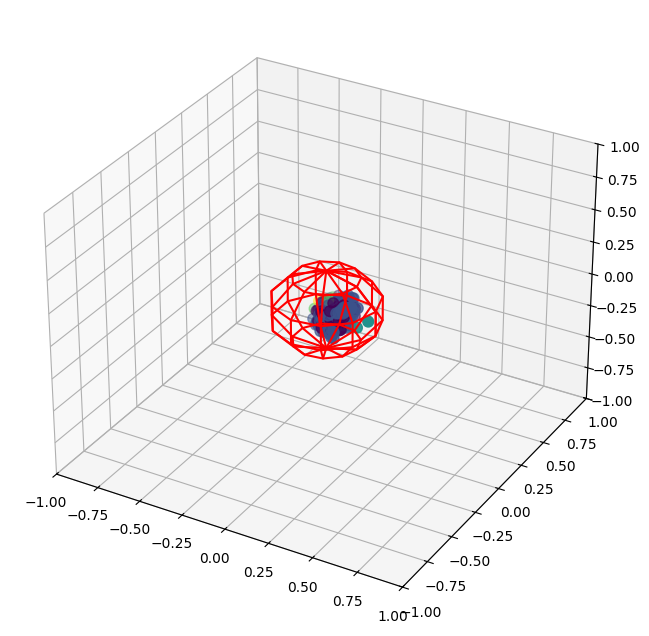

In [38]:
import matplotlib.pyplot as plt
from IPython.display import HTML
from IPython.display import display
from matplotlib import animation
import plotly.offline as pyo
pyo.init_notebook_mode()
import plotly.io as pio
pio.renderers.default = 'iframe'

labels = node_type_labels

g = g_obs

x_max,y_max,z_max = 1, 1, 1

def animate(i):
    embed = embeddings[i].detach().cpu().numpy()
    embed = np.array([embed[x] for x in range(len(g.nodes()))])
    ax.clear()
    ax.scatter(embed[:, 0], embed[:, 1], embed[:, 2], s=60, c=labels)
    ax.scatter(0, 0, s=35, c='red')
    
    u, v = np.mgrid[0:2*np.pi:12j, 0:np.pi:6j]
    x = radius * np.cos(u)*np.sin(v)
    y = radius * np.sin(u)*np.sin(v)
    z = radius * np.cos(v)
    ax.plot_wireframe(x, y, z, color="r")
    ax.set_zlim(-z_max, z_max)

    plt.xlim([-x_max, x_max])
    plt.ylim([-y_max, y_max])

fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(projection='3d')

anim = animation.FuncAnimation(fig, animate, np.arange(0, epochs, 25), interval=800, repeat=True)
html = HTML(anim.to_html5_video())

In [39]:
display(html)

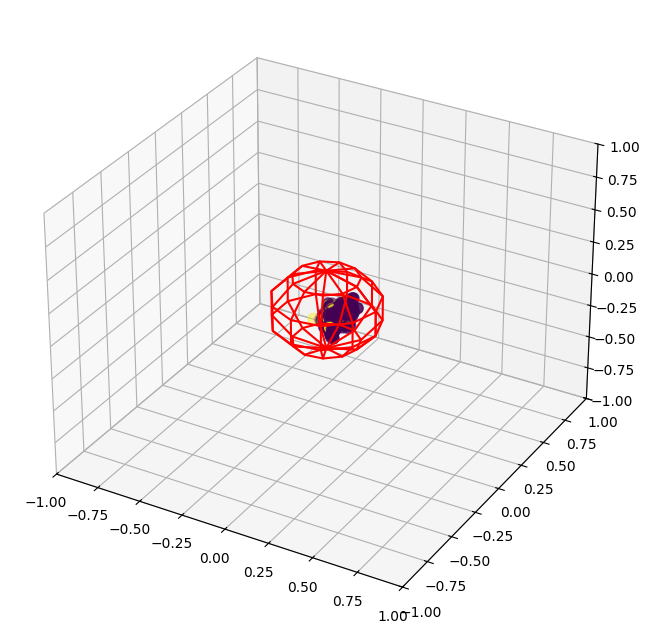

In [40]:
labels = []
idxs = []
g = g_obs

count=0
for node in g.nodes():
    labels.append(g.nodes[node]['label'])
    if g.nodes[node]['label'] == 'causal' and g.nodes[node]['train'] == 1:
        idxs.append(node_to_index[node])
    elif g.nodes[node]['label'] == 'non_causal' and g.nodes[node]['test'] == 1:
        idxs.append(node_to_index[node])
    elif g.nodes[node]['label'] == 'causal' and g.nodes[node]['test'] == 1:
        idxs.append(node_to_index[node])
    count+=1

labels = np.array([0 if labels[x]=='causal' else 1 for x in idxs])
x_max,y_max,z_max = 1, 1, 1

def animate(i):
    embed = embeddings[i].detach().cpu().numpy()
    embed = np.array([embed[x] for x in idxs])
    ax.clear()
    ax.scatter(embed[:, 0], embed[:, 1], embed[:, 2], s=60, c=labels)
    ax.scatter(0, 0, s=35, c='red')
    
    u, v = np.mgrid[0:2*np.pi:12j, 0:np.pi:6j]
    x = radius * np.cos(u)*np.sin(v)
    y = radius * np.sin(u)*np.sin(v)
    z = radius * np.cos(v)
    ax.plot_wireframe(x, y, z, color="r")
    ax.set_zlim(-z_max, z_max)
    
    plt.xlim([-x_max, x_max])
    plt.ylim([-y_max, y_max])

fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(projection='3d')

anim = animation.FuncAnimation(fig, animate, np.arange(0, epochs, 25), interval=800, repeat=True)
html = HTML(anim.to_html5_video())

In [41]:
display(html)